<a href="https://colab.research.google.com/github/ItsUtsavPoddar/solaris/blob/master/research.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Research Paper**

### Pioneering the Solar Evolution: Harnessing Solar Power Predictions using Machine Learning for a Sustainable Tomorrow



# **Load Data**


In [1]:
import pandas as pd

#df = pd.read_csv('https://raw.githubusercontent.com/ItsUtsavPoddar/solaris/master/ITER%20Bhubaneswar%202016-20%2010min/all_Years.csv')
df = pd.read_csv('https://raw.githubusercontent.com/ItsUtsavPoddar/solaris/master/ITER%20Bhubaneswar%202016-20%2010min/all_Years.csv', parse_dates= {"Date" : ["Year","Month","Day"]})
df.columns

Index(['Date', 'Hour', 'Minute', 'Temperature', 'Dew Point', 'DHI', 'DNI',
       'GHI', 'Surface Albedo', 'Pressure', 'Wind Direction', 'Wind Speed',
       'Clearsky GHI', 'Clearsky DNI', 'Clearsky DHI', 'Cloud Type',
       'Solar Zenith Angle', 'Precipitable Water', 'Fill Flag', 'Ozone',
       'Relative Humidity'],
      dtype='object')

In [2]:
df.head()

,Date,Hour,Minute,Temperature,Dew Point,DHI,DNI,GHI,Surface Albedo,Pressure,...,Wind Speed,Clearsky GHI,Clearsky DNI,Clearsky DHI,Cloud Type,Solar Zenith Angle,Precipitable Water,Fill Flag,Ozone,Relative Humidity
0,2016-01-01,0,0,18.4,17.8,0,0,0,0.17,1012,...,1.3,0,0,0,0,170.32,2.1,0,0.241,96.35
1,2016-01-01,0,10,18.4,17.8,0,0,0,0.17,1012,...,1.3,0,0,0,0,168.08,2.1,0,0.241,96.35
2,2016-01-01,0,20,18.4,17.8,0,0,0,0.17,1012,...,1.3,0,0,0,0,165.82,2.1,0,0.241,96.35
3,2016-01-01,0,30,18.4,17.8,0,0,0,0.17,1012,...,1.3,0,0,0,0,163.53,2.1,0,0.241,96.35
4,2016-01-01,0,40,18.4,17.8,0,0,0,0.17,1012,...,1.3,0,0,0,0,161.24,2.1,0,0.241,96.20


In [3]:
df.describe()

,Hour,Minute,Temperature,Dew Point,DHI,DNI,GHI,Surface Albedo,Pressure,Wind Direction,Wind Speed,Clearsky GHI,Clearsky DNI,Clearsky DHI,Cloud Type,Solar Zenith Angle,Precipitable Water,Fill Flag,Ozone,Relative Humidity
count,262800.0000,262800.000000,262800.000000,262800.000000,262800.000000,262800.000000,262800.000000,262800.000000,262800.000000,262800.000000,262800.000000,262800.000000,262800.000000,262800.000000,262800.000000,262800.000000,262800.000000,262800.000000,262800.000000,262800.000000
mean,11.5000,25.000000,26.581035,21.705021,103.245563,164.598912,214.646191,0.172471,1004.877405,183.319266,2.569648,261.046115,243.698752,91.575228,3.094349,89.785016,4.298134,0.301891,0.263094,77.510729
std,6.9222,17.078284,5.110545,5.129351,136.900977,242.731470,296.394685,0.011500,6.019250,89.509677,1.376119,335.403384,293.125300,112.874813,3.307061,44.697639,2.031603,1.063832,0.014426,18.616706
min,0.0000,0.000000,9.200000,1.500000,0.000000,0.000000,0.000000,0.140000,983.000000,0.000000,0.200000,0.000000,0.000000,0.000000,0.000000,0.750000,0.600000,0.000000,0.218000,13.360000
25%,5.7500,10.000000,23.875000,17.700000,0.000000,0.000000,0.000000,0.160000,1000.000000,135.000000,1.500000,0.000000,0.000000,0.000000,0.000000,50.960000,2.500000,0.000000,0.254000,67.350000
50%,11.5000,25.000000,27.100000,23.600000,0.000000,0.000000,0.000000,0.170000,1005.000000,200.000000,2.300000,0.000000,0.000000,0.000000,1.000000,89.400000,4.100000,0.000000,0.265000,82.320000
75%,17.2500,40.000000,29.500000,26.100000,202.000000,327.000000,432.000000,0.180000,1010.000000,230.000000,3.400000,567.000000,535.000000,182.000000,7.000000,128.620000,6.400000,0.000000,0.273000,92.910000
max,23.0000,50.000000,43.100000,28.800000,514.000000,950.000000,1023.000000,0.200000,1019.000000,360.000000,11.600000,1023.000000,950.000000,565.000000,9.000000,179.450000,8.200000,5.000000,0.303000,100.000000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 262800 entries, 0 to 262799
Data columns (total 21 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   Date                262800 non-null  datetime64[ns]
 1   Hour                262800 non-null  int64         
 2   Minute              262800 non-null  int64         
 3   Temperature         262800 non-null  float64       
 4   Dew Point           262800 non-null  float64       
 5   DHI                 262800 non-null  int64         
 6   DNI                 262800 non-null  int64         
 7   GHI                 262800 non-null  int64         
 8   Surface Albedo      262800 non-null  float64       
 9   Pressure            262800 non-null  int64         
 10  Wind Direction      262800 non-null  int64         
 11  Wind Speed          262800 non-null  float64       
 12  Clearsky GHI        262800 non-null  int64         
 13  Clearsky DNI        262800 no

In [5]:
df.isna().sum()

Date                  0
Hour                  0
Minute                0
Temperature           0
Dew Point             0
DHI                   0
DNI                   0
GHI                   0
Surface Albedo        0
Pressure              0
Wind Direction        0
Wind Speed            0
Clearsky GHI          0
Clearsky DNI          0
Clearsky DHI          0
Cloud Type            0
Solar Zenith Angle    0
Precipitable Water    0
Fill Flag             0
Ozone                 0
Relative Humidity     0
dtype: int64

In [6]:
!python --version

Python 3.10.12


## **Separating x and y**


In [7]:

y = df['GHI']
y

0         0
1         0
2         0
3         0
4         0
         ..
262795    0
262796    0
262797    0
262798    0
262799    0
Name: GHI, Length: 262800, dtype: int64

DHI, DNI, Clearsky GHI, Clearsky DHI and Clearsky DNI are dropped because they are directly and very much positively correlated to GHI.

In [8]:
to_drop = ['GHI','Hour','Minute','Date', 'DHI', 'DNI', 'Clearsky GHI','Clearsky DHI','Clearsky DNI', 'Fill Flag']
x = df.drop(to_drop,axis=1)
x.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 262800 entries, 0 to 262799
Data columns (total 11 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Temperature         262800 non-null  float64
 1   Dew Point           262800 non-null  float64
 2   Surface Albedo      262800 non-null  float64
 3   Pressure            262800 non-null  int64  
 4   Wind Direction      262800 non-null  int64  
 5   Wind Speed          262800 non-null  float64
 6   Cloud Type          262800 non-null  int64  
 7   Solar Zenith Angle  262800 non-null  float64
 8   Precipitable Water  262800 non-null  float64
 9   Ozone               262800 non-null  float64
 10  Relative Humidity   262800 non-null  float64
dtypes: float64(8), int64(3)
memory usage: 22.1 MB


In [9]:
from collections import Counter

counts = Counter(df['Fill Flag'])

for number, count in counts.items():
    print(f"{number}: {count}")

0: 239077
1: 5315
5: 9399
3: 9009


In [12]:
import numpy as np
a = np.count_nonzero(y, axis = 0)
# Percentage of NON ZERO GHI values (Balanced)
print ((a/len(y))*100)

49.6837899543379


#**About Data**



1.   **Irradiance:** (Watt per square meter)

      power per unit area (surface power density) received from the Sun in the form of electromagnetic radiation

      DNI: (Direct Normal Irradiance) This term refers to the radiations that reach the earth's surface from the sun per unit area and are normal to the surface. Keeping a surface normal to incoming radiation makes it feasible to maximize the amount of irradiance it gets annually.
      
      DHI: (Diffused Horizontal Irradiance) The quantity of the sun's light scattered by the atmosphere and reaching the surface per unit area is known as diffuse horizontal irradiance or DHI. It excludes sunlight that is shining directly in front of you.

      GHI: (Global Horizontal Irradiance) The total quantity of short-wave radiation that the horizontal earth's surface receives per unit. The value includes the DHI and DNI components of a SolarZenith Angle value.

      It can be stated statistically as follows:

      GHI = DHI + (DNI x cosθ)


  CLEARSKY Data (This is assuming clear sky condition)

---------------------------------------------------------
2.   **Solar zenith angle:** (Degrees)

       Solar-Zenith Angle (θ) is the angle formed by the sun's beams and the vertical axis.


-------------------------------------------------
3.   **Surface Albedo:** (Unitless)

      The albedo of Earth's surface (atmosphere, ocean, land surfaces) determines how much incoming solar energy, or light, is immediately reflected back to space.



-----------------------------------------------
4.   **Fill flag:** (Unitless)

      N/A: 0

      Missing Image: 1

      Low Irradiance: 2

      Exceeds Clearsky: 3

      Missing Cloud Properties: 4

      Rayleigh Violation: 5



In [62]:
import plotly.graph_objects as go
fig = go.Figure([go.Scatter(y=df['GHI'], x=df['Date'],
                            marker_color='black',
                            name='Value 1')])

# plot figurea
fig.show()

In [65]:
import plotly.graph_objects as go
fig = go.Figure([go.Scatter(y=df['Temperature'], x=df['GHI'],
                            marker_color='black',
                            name='Value 1')])

# plot figurea
fig.show()

In [64]:
import plotly.graph_objects as go
fig = go.Figure([go.Scatter(x=df['Solar Zenith Angle'], y=df['GHI'],
                            marker_color='black',
                            name='Value 1')])

# plot figurea
fig.show()

# **Dimensionality Reduction**


### **Random forest classifier**

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rnd_clf = RandomForestClassifier(n_estimators=5, random_state=42,n_jobs=-1)
rnd_clf.fit(x, y)
for score, name in zip(rnd_clf.feature_importances_, x.columns):
    print(round(score, 2), name)

0.1 Temperature
0.05 Dew Point
0.02 Surface Albedo
0.04 Pressure
0.08 Wind Direction
0.07 Wind Speed
0.02 Cloud Type
0.42 Solar Zenith Angle
0.05 Precipitable Water
0.05 Ozone
0.09 Relative Humidity


### **Pearson HeatMap**

<Axes: >

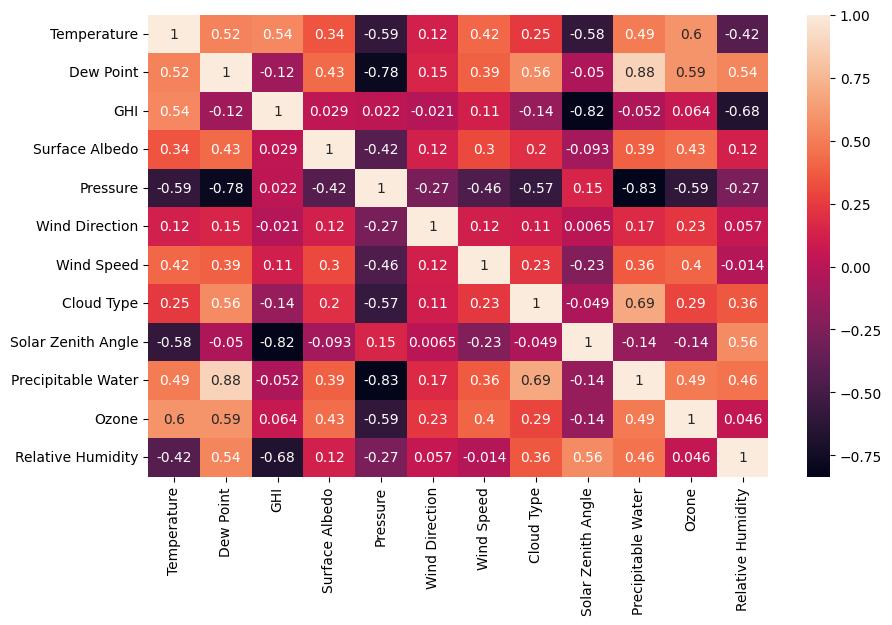

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
# Correlation matrix
td = ['Hour','Minute','Date', 'DHI', 'DNI', 'Clearsky GHI','Clearsky DHI','Clearsky DNI', 'Fill Flag']
new_df = df.drop(td, axis=1)
cor = new_df.corr()
# Plotting Heatmap
plt.figure(figsize = (10,6))
sns.heatmap(cor, annot=True)

### **Embedded using LASSO**

In [ ]:
from sklearn.linear_model import LassoCV
reg = LassoCV()
reg.fit(x, y)
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(x,y))
coef = pd.Series(reg.coef_, index = x.columns)

Best alpha using built-in LassoCV: 10.896954
Best score using built-in LassoCV: 0.763028


Lasso picked 7 variables and eliminated the other 4 variables


Text(0.5, 1.0, 'Feature importance using Lasso Model')

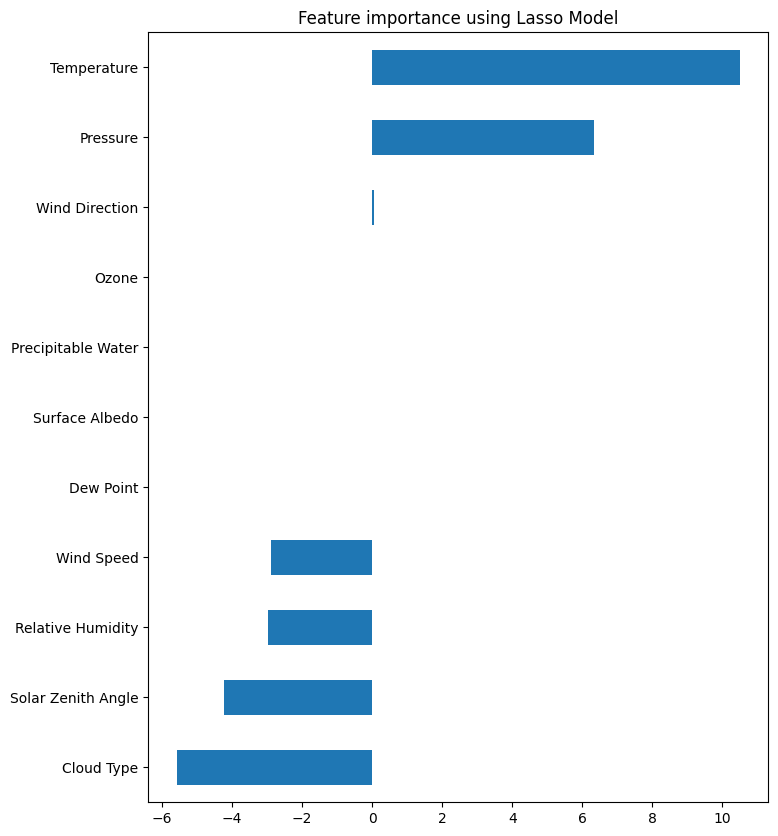

In [ ]:
print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")
imp_coef = coef.sort_values()
import matplotlib
matplotlib.rcParams['figure.figsize'] = (8.0, 10.0)
imp_coef.plot(kind = "barh")
plt.title("Feature importance using Lasso Model")

### **Recursive Feature Elimination using Linear Regression**


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split

import numpy as np
high_score=0
#Variable to store the optimum features
nof=0
score_list =[]
model = LinearRegression()
for n in range(1,13):
    X_train, X_test, y_train, y_test = train_test_split(x,y, test_size = 0.2, random_state = 0)
    rfe = RFE(model,n_features_to_select=n)
    X_train_rfe = rfe.fit_transform(X_train,y_train)
    X_test_rfe = rfe.transform(X_test)
    model.fit(X_train_rfe,y_train)
    score = model.score(X_test_rfe,y_test)
    score_list.append(score)
    if(score>high_score):
        high_score = score
        nof = n
print("Optimum number of features: %d" %nof)
print("Score with %d features: %f" % (nof, high_score))

Optimum number of features: 11
Score with 11 features: 0.770169


In [ ]:
cols = list(x.columns)
model = LinearRegression()

rfe = RFE(model,n_features_to_select=11)

#Transforming data using RFE
X_rfe = rfe.fit_transform(x,y)
#Fitting the data to model
model.fit(X_rfe,y)
temp = pd.Series(rfe.support_,index = cols)
selected_features_rfe = temp[temp==True].index
print(selected_features_rfe)

Index(['Temperature', 'Dew Point', 'Surface Albedo', 'Pressure',
       'Wind Direction', 'Wind Speed', 'Cloud Type', 'Solar Zenith Angle',
       'Precipitable Water', 'Ozone', 'Relative Humidity'],
      dtype='object')


IT JUST SELECTED ALL OF IT

# **Data Preparation**


## **Removing Dimensions**

In [14]:
to_drop = ['GHI','Hour','Minute','Date', 'DHI', 'DNI', 'Clearsky GHI','Clearsky DHI','Clearsky DNI', 'Fill Flag','Ozone','Dew Point','Surface Albedo','Pressure']
x_dropped = df.drop(to_drop,axis=1)
from sklearn.model_selection import train_test_split

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
x_dropped = scaler.fit_transform(x_dropped)
x_dropped_train_scaled ,x_dropped_test_scaled , y_train, y_test = train_test_split(x_dropped,y,test_size=0.2,shuffle=False)



## **Data Spilting**

In [15]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.2,shuffle=False)

In [16]:
x_train

,Temperature,Dew Point,Surface Albedo,Pressure,Wind Direction,Wind Speed,Cloud Type,Solar Zenith Angle,Precipitable Water,Ozone,Relative Humidity
0,18.4,17.8,0.17,1012,127,1.3,0,170.32,2.1,0.241,96.35
1,18.4,17.8,0.17,1012,128,1.3,0,168.08,2.1,0.241,96.35
2,18.4,17.8,0.17,1012,128,1.3,0,165.82,2.1,0.241,96.35
3,18.4,17.8,0.17,1012,129,1.3,0,163.53,2.1,0.241,96.35
4,18.4,17.8,0.17,1012,129,1.3,0,161.24,2.1,0.241,96.20
...,...,...,...,...,...,...,...,...,...,...,...
210235,14.4,13.4,0.16,1015,54,2.0,0,176.37,1.8,0.247,93.70
210236,14.3,13.4,0.16,1015,54,2.0,0,177.16,1.8,0.247,94.30
210237,14.2,13.4,0.16,1015,54,2.0,0,176.29,1.8,0.247,94.91
210238,14.2,13.1,0.16,1015,54,2.0,0,174.51,1.8,0.247,93.03


In [17]:
x_test

,Temperature,Dew Point,Surface Albedo,Pressure,Wind Direction,Wind Speed,Cloud Type,Solar Zenith Angle,Precipitable Water,Ozone,Relative Humidity
210240,16.1,13.7,0.16,1012,59,1.6,0,170.32,1.9,0.240,85.60
210241,16.0,13.7,0.16,1012,57,1.5,0,168.08,1.9,0.240,86.15
210242,15.9,13.7,0.16,1012,55,1.5,0,165.81,1.9,0.240,86.70
210243,15.8,13.7,0.16,1012,54,1.5,0,163.53,1.9,0.240,87.25
210244,15.7,13.7,0.16,1012,52,1.5,0,161.24,1.9,0.240,87.64
...,...,...,...,...,...,...,...,...,...,...,...
262795,16.5,13.7,0.16,1012,64,1.6,0,176.37,2.0,0.239,83.52
262796,16.4,13.7,0.16,1012,63,1.6,0,177.22,2.0,0.239,84.05
262797,16.3,13.7,0.16,1012,62,1.6,0,176.39,2.0,0.239,84.59
262798,16.2,13.7,0.16,1012,61,1.6,0,174.60,2.0,0.239,85.06


In [18]:
# prompt: Using dataframe x_train: normalize attributes using min max

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.fit_transform(x_test)


In [19]:
print (x_train_scaled.shape)
x_test_scaled.shape


(210240, 11)


(52560, 11)

# **Machine Learning Models**


## **Linear Regression**


In [ ]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(x_train_scaled, y_train)

LinearRegression()

In [ ]:
y_lr_train_pred = lr.predict(x_train_scaled)

In [ ]:
print(y_lr_train_pred[10152])
y_train[10152]

787.8285276543331


752

In [ ]:
y_lr_test_pred = lr.predict(x_test_scaled)

In [ ]:
import numpy as np
from sklearn.metrics import mean_squared_error

lr_train_mse = mean_squared_error(y_train , y_lr_train_pred)
lr_train_rmse = np.sqrt(lr_train_mse)
lr_results = pd.DataFrame(['Linear Regression', lr_train_rmse]).transpose()
lr_results.columns = ['Method', 'Training RMSE']
lr_results

,Method,Training RMSE
0,Linear Regression,141.722873


In [ ]:
lr_test_rmse = np.sqrt(mean_squared_error(y_test , y_lr_test_pred))

lr_results = pd.DataFrame(['Linear Regression', lr_test_rmse]).transpose()
lr_results.columns = ['Method', 'Test RMSE']
lr_results

,Method,Test RMSE
0,Linear Regression,155.687651


[]

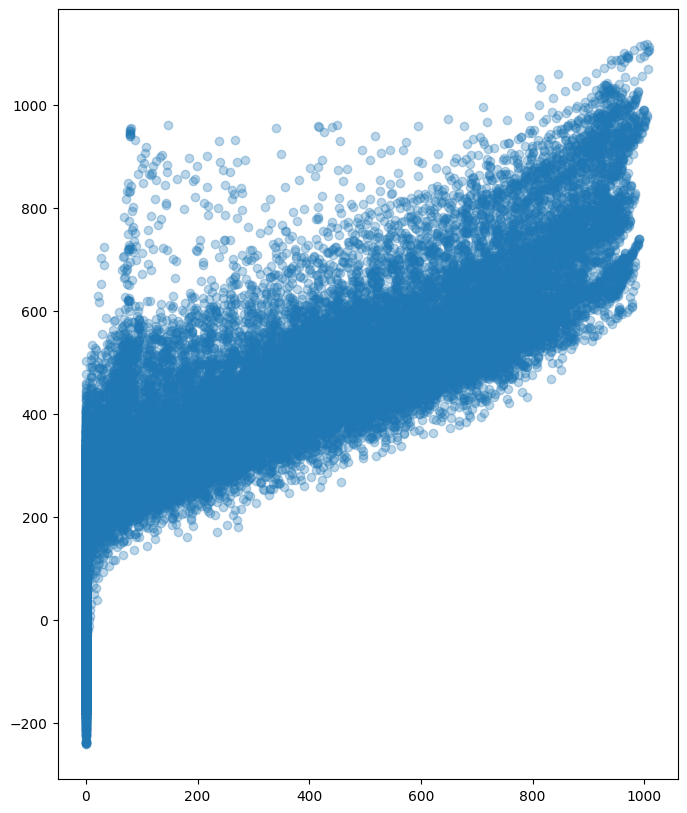

In [ ]:
# @title
import matplotlib.pyplot as plt

plt.scatter (x = y_test , y= y_lr_test_pred , alpha=0.3)

plt.plot()

## **Ridge Regression**

In [ ]:
from sklearn.linear_model import Ridge
ridge_reg = Ridge(alpha=1, solver="cholesky")
ridge_reg.fit(x_train_scaled, y_train)


Ridge(alpha=1, solver='cholesky')

In [ ]:
print(ridge_reg.coef_)
ridge_reg.intercept_

[ 914.70339543 -401.04211624   16.64073504  283.23500547   23.5878527
  -92.05995683  -64.91891453 -751.58896435   45.89231598  -73.72980383
   93.49988719]


215.18015924334117

In [ ]:
rr_pred = ridge_reg.predict(x_test_scaled)

In [ ]:
rr_test_rmse = np.sqrt(mean_squared_error(y_test , rr_pred))

rr_results = pd.DataFrame(['Ridge Regression', rr_test_rmse]).transpose()
rr_results.columns = ['Method', 'Test RMSE']
rr_results

,Method,Test RMSE
0,Ridge Regression,155.399701


## **Lasso Regression**

In [ ]:
from sklearn.linear_model import Lasso
lasso_reg = Lasso(alpha=0.1)
lasso_reg.fit(x_train_scaled, y_train)


Lasso(alpha=0.1)

In [ ]:
import numpy as np
from sklearn.metrics import mean_squared_error

lasso_pred = lasso_reg.predict(x_test_scaled)

test_rmse = np.sqrt(mean_squared_error(y_test , lasso_pred))

results = pd.DataFrame(['Lasso Regression', test_rmse]).transpose()
results.columns = ['Method', 'Test RMSE']
results

,Method,Test RMSE
0,Lasso Regression,151.483


## **Elastic Net**

In [ ]:
from sklearn.linear_model import ElasticNet
elastic_net = ElasticNet(alpha=0.1, l1_ratio=0.5)
elastic_net.fit(x_train_scaled, y_train)


ElasticNet(alpha=0.1)

In [ ]:
import numpy as np
from sklearn.metrics import mean_squared_error

elastic_pred = elastic_net.predict(x_test_scaled)

test_rmse = np.sqrt(mean_squared_error(y_test , elastic_pred))

results = pd.DataFrame(['elastic Regression', test_rmse]).transpose()
results.columns = ['Method', 'Test RMSE']
results

,Method,Test RMSE
0,elastic Regression,173.562134


## **Decision Trees**

In [ ]:
from sklearn.tree import DecisionTreeRegressor
import numpy as np
from sklearn.metrics import mean_squared_error
tree_reg = DecisionTreeRegressor()

tree_reg.fit(x_train_scaled, y_train)

DecisionTreeRegressor()

In [ ]:
pred = tree_reg.predict(x_train_scaled)
tree_mse = mean_squared_error(y_train, pred)
tree_rmse = np.sqrt(tree_mse)
tree_rmse


0.03084305042490022

In [ ]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(tree_reg, x_train_scaled, y_train, scoring="neg_mean_squared_error", cv=15,n_jobs=-1)
rmse_scores = np.sqrt(-scores)

In [ ]:
def display_scores(scores):
 print("Scores:", scores)
 print("Mean:", scores.mean())
 print("Standard deviation:", scores.std())

display_scores(rmse_scores)

Scores: [ 51.22469514 100.41284251 114.00284978  40.69836368  42.28671806
 111.52611795 108.87858253  39.20272798  59.88072119 131.37281626
  67.87933639  46.36728773  64.97859621 118.58150026  60.45870428]
Mean: 77.18345732988769
Standard deviation: 31.790100277892577


In [ ]:
pred1 = tree_reg.predict(x_test_scaled)
tree_mse1 = mean_squared_error(y_test, pred1)
tree_rmse1 = np.sqrt(tree_mse1)
tree_rmse1


93.47807392332173

## **Random Forest**

In [ ]:
from sklearn.ensemble import RandomForestRegressor

rf1 = RandomForestRegressor()
rf1.fit(x_train_scaled, y_train)

p = rf1.predict(x_test_scaled)

from sklearn.metrics import mean_squared_error

errors = abs(p - y_test)
result = mean_squared_error(y_test, p)
result = np.sqrt(result)
# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2),'and RMSE:',result, 'GHI Value.')

Mean Absolute Error: 28.53 and RMSE: 68.81930561979864 GHI Value.


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

rf = RandomForestRegressor()
param_grid = [{'n_estimators': [3, 10, 30], 'max_features': [2, 4, 6, 8]},{'bootstrap': [False], 'n_estimators': [3, 10], 'max_features': [2, 3, 4]},]
grid_search = GridSearchCV(rf, param_grid, cv=5,scoring='neg_mean_squared_error',n_jobs=-1)
grid_search.fit(x_train_scaled, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid=[{'max_features': [2, 4, 6, 8],
                          'n_estimators': [3, 10, 30]},
                         {'bootstrap': [False], 'max_features': [2, 3, 4],
                          'n_estimators': [3, 10]}],
             scoring='neg_mean_squared_error')

In [ ]:
grid_search.best_estimator_
#'max_features': 8, 'n_estimators': 30


RandomForestRegressor(max_features=8, n_estimators=30)

In [ ]:
cvres = grid_search.cv_results_
for mean_score, params in zip(cvres["mean_test_score"], cvres["params"]):
  print(np.sqrt(-mean_score), params)

86.07593281235566 {'max_features': 2, 'n_estimators': 3}
76.29938385924932 {'max_features': 2, 'n_estimators': 10}
70.94523781266554 {'max_features': 2, 'n_estimators': 30}
72.76477206690697 {'max_features': 4, 'n_estimators': 3}
65.19992778771763 {'max_features': 4, 'n_estimators': 10}
62.90913656444293 {'max_features': 4, 'n_estimators': 30}
69.3976169857342 {'max_features': 6, 'n_estimators': 3}
63.43846053699927 {'max_features': 6, 'n_estimators': 10}
61.37891743167783 {'max_features': 6, 'n_estimators': 30}
68.99057314932857 {'max_features': 8, 'n_estimators': 3}
62.98585299767217 {'max_features': 8, 'n_estimators': 10}
61.2417489475966 {'max_features': 8, 'n_estimators': 30}
87.21373340280458 {'bootstrap': False, 'max_features': 2, 'n_estimators': 3}
73.94211768563812 {'bootstrap': False, 'max_features': 2, 'n_estimators': 10}
77.41352393152296 {'bootstrap': False, 'max_features': 3, 'n_estimators': 3}
68.194390139402 {'bootstrap': False, 'max_features': 3, 'n_estimators': 10}
73

In [ ]:
for score, name in zip(grid_search.best_estimator_.feature_importances_, x.columns):
    print(round(score, 2), name)

0.07 Temperature
0.0 Dew Point
0.0 Surface Albedo
0.0 Pressure
0.01 Wind Direction
0.01 Wind Speed
0.07 Cloud Type
0.79 Solar Zenith Angle
0.01 Precipitable Water
0.0 Ozone
0.03 Relative Humidity


0.1 Temperature
0.05 Dew Point
0.02 Surface Albedo
0.04 Pressure
0.08 Wind Direction
0.07 Wind Speed
0.02 Cloud Type
0.42 Solar Zenith Angle
0.05 Precipitable Water
0.05 Ozone
0.09 Relative Humidity

In [ ]:
rf = RandomForestRegressor(max_features= 8, n_estimators= 30, random_state = 42)
rf.fit(x_train_scaled, y_train)



RandomForestRegressor(max_features=8, n_estimators=30, random_state=42)

In [ ]:
predictions = rf.predict(x_test_scaled)
errors = abs(predictions - y_test)
from sklearn.metrics import mean_squared_error
result = mean_squared_error(y_test, predictions)
result = np.sqrt(result)
# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2),'and RMSE:',result, 'GHI Value.')

Mean Absolute Error: 28.09 and RMSE: 67.29742005616534 GHI Value.


## **SVM Regression**

In [ ]:
from sklearn.svm import SVR
svm_reg = SVR(kernel='linear')
X_sample, y_sample = x_dropped_train_scaled, y_train
svm_reg.fit(X_sample, y_sample)


In [ ]:
import matplotlib.pyplot as plt
y_pred = svm_reg.predict(x_dropped_test_scaled)


In [ ]:
errors = abs(y_pred - y_test)
from sklearn.metrics import mean_squared_error
result = mean_squared_error(y_test, y_pred)
result = np.sqrt(result)
# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2),'and RMSE:',result, 'GHI Value.')

Mean Absolute Error: 119.91 and RMSE: 153.65559101455014 GHI Value.


# **Ensemble Models**

### **Gradient Booster**

In [40]:
from sklearn.ensemble import GradientBoostingRegressor

gbrt = GradientBoostingRegressor( max_depth=4, learning_rate=0.1, n_estimators=600,n_iter_no_change=10, random_state=42)
gbrt.fit(x_dropped_train_scaled, y_train)

GradientBoostingRegressor(max_depth=4, n_estimators=600, n_iter_no_change=10,
                          random_state=42)

In [41]:
gbrt.n_estimators_


600

In [51]:
p = gbrt.predict(x_dropped_test_scaled)

In [52]:
from sklearn.metrics import mean_squared_error
import numpy as np
errors = abs(p - y_test)
result = mean_squared_error(y_test, p)
result = np.sqrt(result)
# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2),'and RMSE:',result, 'GHI Value.')

Mean Absolute Error: 28.67 and RMSE: 65.47604825582324 GHI Value.


### **Stacked Generalization (Stacking)**

In [56]:
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
estimators = [('lasso', Lasso()),('rf', RandomForestRegressor(max_features= 8, n_estimators= 30,random_state=42)),('knr', KNeighborsRegressor(n_neighbors=20,metric='euclidean'))]

from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import StackingRegressor

final_estimator = GradientBoostingRegressor(n_estimators=25, subsample=0.5, min_samples_leaf=25, max_features=1,random_state=42)
reg = StackingRegressor(estimators=estimators,final_estimator=final_estimator)

reg.fit(x_dropped_train_scaled, y_train)

StackingRegressor(estimators=[('lasso', Lasso()),
                              ('rf',
                               RandomForestRegressor(max_features=8,
                                                     n_estimators=30,
                                                     random_state=42)),
                              ('knr',
                               KNeighborsRegressor(metric='euclidean',
                                                   n_neighbors=20))],
                  final_estimator=GradientBoostingRegressor(max_features=1,
                                                            min_samples_leaf=25,
                                                            n_estimators=25,
                                                            random_state=42,
                                                            subsample=0.5))

In [58]:
y_pred = reg.predict(x_dropped_test_scaled)
from sklearn.metrics import r2_score
print('R2 score: {:.2f}'.format(r2_score(y_test, y_pred)))

from sklearn.metrics import mean_squared_error
import numpy as np
errors = abs(y_pred - y_test)
result = mean_squared_error(y_test, y_pred)
result = np.sqrt(result)
# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2),'and RMSE:',result, 'GHI Value.')

R2 score: 0.94
Mean Absolute Error: 44.54 and RMSE: 74.38216930148884 GHI Value.


# **Neural Networks and Deep Learning**








































.
.
.
..
.
.
.
.
.
.
.
.
.
.
.
.




















































.
.
.
..
.
.
.
.
.
.
.
.
.
.
.
.





























































.
.
.
..
.
.
.
.





.
.
.
.
.


.
.
.
.
.
.
.

.
..




.

.
.
.
.
.
.

.

.
.
.




.
.
.
.




.
.

.


.
.
.
.
.
.
.
.


































